In [ ]:
!pip install pycocotools -q
!pip install opencv-python -q

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
from pycocotools.coco import COCO
import urllib.request
from sklearn.model_selection import train_test_split
import random
from tqdm import tqdm
import zipfile

print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Cell 2: Download COCO 2017 Train dataset

In [ ]:

import os

# Create directories
os.makedirs('coco', exist_ok=True)
os.makedirs('coco/images', exist_ok=True)
os.makedirs('coco/annotations', exist_ok=True)

# Download annotations
print("Downloading COCO annotations...")
annotation_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
annotation_path = "coco/annotations_trainval2017.zip"

if not os.path.exists(annotation_path):
    urllib.request.urlretrieve(annotation_url, annotation_path)
    print("Extracting annotations...")
    with zipfile.ZipFile(annotation_path, 'r') as zip_ref:
        zip_ref.extractall('coco/')
    print("Annotations downloaded and extracted!")
else:
    print("Annotations already exist!")

# Download train images (warning: this is large ~18GB)
print("\nDownloading COCO train2017 images...")
image_url = "http://images.cocodataset.org/zips/train2017.zip"
image_path = "coco/train2017.zip"

if not os.path.exists(image_path) and not os.path.exists('coco/train2017'):
    print("This will download ~18GB of data. Please wait...")
    urllib.request.urlretrieve(image_url, image_path)
    print("Extracting images...")
    with zipfile.ZipFile(image_path, 'r') as zip_ref:
        zip_ref.extractall('coco/')
    print("Images downloaded and extracted!")
else:
    print("Images already exist!")

print("\nDataset ready!")

Extracting annotations...
Annotations downloaded and extracted!

This will download ~18GB of data. Please wait...
Extracting images...
Images downloaded and extracted!

Dataset ready!


# Cell 3: Initialize COCO API and prepare data

In [ ]:
IMAGE_SIZE = (250, 250)
NUM_IMAGES = 40000

# Initialize COCO API
annotation_file = 'coco/annotations/instances_train2017.json'
coco = COCO(annotation_file)

# Get all image IDs
all_img_ids = coco.getImgIds()
print(f"Total images in COCO dataset: {len(all_img_ids)}")

# Randomly select 40000 images
random.seed(42)
selected_img_ids = random.sample(all_img_ids, min(NUM_IMAGES, len(all_img_ids)))
print(f"Selected {len(selected_img_ids)} images for training")

def load_image_and_mask(img_id, coco, img_dir='coco/train2017'):
    """Load image and create binary mask"""
    # Load image info
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    # Read and resize image
    img = cv2.imread(img_path)
    if img is None:
        return None, None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMAGE_SIZE)
    img = img.astype(np.float32) / 255.0

    # Get annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    # Create binary mask
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    for ann in anns:
        seg_mask = coco.annToMask(ann)
        mask = np.maximum(mask, seg_mask)

    # Resize mask
    mask = cv2.resize(mask, IMAGE_SIZE, interpolation=cv2.INTER_NEAREST)
    mask = mask.astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)

    return img, mask

print("Data loading function ready!")

loading annotations into memory...
Done (t=14.36s)
creating index...
index created!
Total images in COCO dataset: 118287
Selected 40000 images for training
Data loading function ready!


# Cell 4: Load and preprocess images in batches (Memory efficient for 8GB RAM)

In [ ]:
print("Loading images and masks in memory-efficient batches...")

# Process in smaller batches to save memory
PROCESS_BATCH_SIZE = 1000

# Save processed images to disk temporarily
os.makedirs('processed_data', exist_ok=True)

total_loaded = 0
batch_num = 0

for i in tqdm(range(0, len(selected_img_ids), PROCESS_BATCH_SIZE), desc="Processing batches"):
    batch_ids = selected_img_ids[i:i+PROCESS_BATCH_SIZE]

    batch_images = []
    batch_masks = []

    for img_id in batch_ids:
        img, mask = load_image_and_mask(img_id, coco)
        if img is not None and mask is not None:
            batch_images.append(img)
            batch_masks.append(mask)

    if len(batch_images) > 0:
        # Save batch to disk
        np.save(f'processed_data/images_batch_{batch_num}.npy', np.array(batch_images, dtype=np.float32))
        np.save(f'processed_data/masks_batch_{batch_num}.npy', np.array(batch_masks, dtype=np.float32))
        total_loaded += len(batch_images)
        batch_num += 1

        # Clear memory
        del batch_images, batch_masks

print(f"\nTotal images successfully processed: {total_loaded}")
print(f"Saved in {batch_num} batch files")

# Calculate train/val split
val_size = int(total_loaded * 0.15)
train_size = total_loaded - val_size

print(f"Train set: {train_size} images")
print(f"Validation set: {val_size} images")

Loading images and masks in memory-efficient batches...


Processing batches: 100%|██████████| 40/40 [15:42<00:00, 23.55s/it]


Total images successfully processed: 40000
Saved in 40 batch files
Train set: 34000 images
Validation set: 6000 images


# Cell 4B: Create data generator for memory-efficient training (GPU Optimized)


In [ ]:
class DataGenerator(keras.utils.Sequence):
    """Memory-efficient data generator that loads batches on-the-fly"""

    def __init__(self, batch_files, batch_size=16, shuffle=True, validation=False, val_split=0.15):
        self.batch_files = batch_files
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.validation = validation
        self.val_split = val_split

        # Load all data indices
        self.all_indices = []
        for batch_num in range(len(batch_files)):
            images = np.load(f'processed_data/images_batch_{batch_num}.npy', mmap_mode='r')
            num_samples = len(images)
            self.all_indices.extend([(batch_num, i) for i in range(num_samples)])

        # Split into train/val
        split_idx = int(len(self.all_indices) * (1 - val_split))

        if validation:
            self.indices = self.all_indices[split_idx:]
        else:
            self.indices = self.all_indices[:split_idx]

        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.indices) / self.batch_size))

    def __getitem__(self, index):
        # Get batch indices
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

        # Load data
        X, y = self._load_data(batch_indices)
        return X, y

    def _load_data(self, batch_indices):
        X = []
        y = []

        # Group by batch file to minimize file I/O
        batch_groups = {}
        for batch_num, idx in batch_indices:
            if batch_num not in batch_groups:
                batch_groups[batch_num] = []
            batch_groups[batch_num].append(idx)

        # Load from each batch file
        for batch_num, local_indices in batch_groups.items():
            # Use memory mapping to avoid loading entire file
            images = np.load(f'processed_data/images_batch_{batch_num}.npy', mmap_mode='r')
            masks = np.load(f'processed_data/masks_batch_{batch_num}.npy', mmap_mode='r')

            for idx in local_indices:
                X.append(images[idx])
                y.append(masks[idx])

        # Convert to arrays - these will be transferred to GPU automatically
        X = np.array(X, dtype=np.float32)
        y = np.array(y, dtype=np.float32)

        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# Create generators
batch_files = [f'processed_data/images_batch_{i}.npy' for i in range(batch_num)]

train_generator = DataGenerator(
    batch_files,
    batch_size=16,
    shuffle=True,
    validation=False,
    val_split=0.15
)

val_generator = DataGenerator(
    batch_files,
    batch_size=16,
    shuffle=False,
    validation=True,
    val_split=0.15
)

print(f"Train generator: {len(train_generator)} batches ({len(train_generator.indices)} images)")
print(f"Validation generator: {len(val_generator)} batches ({len(val_generator.indices)} images)")
print("\nData generators ready for memory-efficient training!")
print("✓ Data will be loaded in small batches and transferred to GPU automatically")

Train generator: 2125 batches (34000 images)
Validation generator: 375 batches (6000 images)

Data generators ready for memory-efficient training!
✓ Data will be loaded in small batches and transferred to GPU automatically


In [ ]:
import tensorflow as tf
print("GPU Available:", len(tf.config.list_physical_devices('GPU')) > 0)


GPU Available: True


In [ ]:
# Cell 5: Build U-Net model for binary segmentation (Fixed with custom layer)

class CropAndConcat(layers.Layer):
    """Custom layer to crop and concatenate tensors"""

    def call(self, inputs):
        upsampled, encoder_features = inputs

        # Get shapes
        up_shape = tf.shape(upsampled)
        enc_shape = tf.shape(encoder_features)

        # Calculate cropping offsets
        offset_h = (enc_shape[1] - up_shape[1]) // 2
        offset_w = (enc_shape[2] - up_shape[2]) // 2

        # Crop encoder features to match upsampled size
        cropped = encoder_features[:,
                                    offset_h:offset_h + up_shape[1],
                                    offset_w:offset_w + up_shape[2],
                                    :]

        # Concatenate along channel axis
        return tf.concat([upsampled, cropped], axis=-1)

def build_unet(input_shape=(250, 250, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder (downsampling)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder (upsampling) with custom cropping layer
    u6 = layers.UpSampling2D((2, 2))(c5)
    u6 = layers.Conv2D(512, (2, 2), activation='relu', padding='same')(u6)
    u6 = CropAndConcat()([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D((2, 2))(c6)
    u7 = layers.Conv2D(256, (2, 2), activation='relu', padding='same')(u7)
    u7 = CropAndConcat()([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.UpSampling2D((2, 2))(c7)
    u8 = layers.Conv2D(128, (2, 2), activation='relu', padding='same')(u8)
    u8 = CropAndConcat()([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.UpSampling2D((2, 2))(c8)
    u9 = layers.Conv2D(64, (2, 2), activation='relu', padding='same')(u9)
    u9 = CropAndConcat()([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    # Resize to exactly 250x250 if needed
    outputs = layers.Resizing(250, 250)(outputs)

    model = keras.Model(inputs=[inputs], outputs=[outputs])
    return model

# Build the model
model = build_unet(input_shape=(250, 250, 3))
model.summary()

print("\n✓ Model built successfully with custom CropAndConcat layer!")

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 250, 250,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 250, 250,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 250, 250,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 125, 125,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 125, 125,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 125, 125,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 62, 62,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 62, 62,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 62, 62,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 31, 31,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 31, 31,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 31, 31,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 15, 15,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 15, 15,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 15, 15,    │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 30, 30,    │          0 │ conv2d_9[0][0]    │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 30, 30,    │  2,097,664 │ up_sampling2d[0]

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)


✓ Model built successfully with custom CropAndConcat layer!


# Cell 5B: Memory check and cleanup before training

In [ ]:
import gc
import psutil

# Get current memory usage
process = psutil.Process()
memory_info = process.memory_info()
memory_used_gb = memory_info.rss / (1024 ** 3)

print("="*60)
print("MEMORY STATUS BEFORE TRAINING")
print("="*60)
print(f"Current RAM usage: {memory_used_gb:.2f} GB")
print(f"Available RAM: {psutil.virtual_memory().available / (1024**3):.2f} GB")
print(f"Total RAM: {psutil.virtual_memory().total / (1024**3):.2f} GB")
print("="*60)

# Clear any existing session
tf.keras.backend.clear_session()

# Force garbage collection
gc.collect()

print("\n✓ Memory cleared and ready for training")
print("\nRecommendations for 8GB RAM:")
print("  - Batch size 8 is recommended")
print("  - Close other applications to free memory")
print("  - Training will use data generators (no full data in RAM)")

# Check if we have enough memory
available_gb = psutil.virtual_memory().available / (1024**3)
if available_gb < 4:
    print("\n⚠️  WARNING: Less than 4GB available RAM")
    print("   Consider restarting the runtime or reducing batch size to 4")
else:
    print(f"\n✓ Sufficient memory available ({available_gb:.2f} GB)")

MEMORY STATUS BEFORE TRAINING
Current RAM usage: 4.47 GB
Available RAM: 6.61 GB
Total RAM: 12.67 GB

✓ Memory cleared and ready for training

Recommendations for 8GB RAM:
  - Batch size 8 is recommended
  - Close other applications to free memory
  - Training will use data generators (no full data in RAM)

✓ Sufficient memory available (6.69 GB)


# Cell 5C: Lightweight U-Net for 8GB RAM (Use this if Cell 5 model crashes)

In [ ]:
class CropAndConcat(layers.Layer):
    """Custom layer to crop and concatenate tensors"""

    def call(self, inputs):
        upsampled, encoder_features = inputs

        # Get shapes
        up_shape = tf.shape(upsampled)
        enc_shape = tf.shape(encoder_features)

        # Calculate cropping offsets
        offset_h = (enc_shape[1] - up_shape[1]) // 2
        offset_w = (enc_shape[2] - up_shape[2]) // 2

        # Crop encoder features to match upsampled size
        cropped = encoder_features[:,
                                    offset_h:offset_h + up_shape[1],
                                    offset_w:offset_w + up_shape[2],
                                    :]

        # Concatenate along channel axis
        return tf.concat([upsampled, cropped], axis=-1)

def build_lightweight_unet(input_shape=(250, 250, 3)):
    """Lighter U-Net with fewer filters - better for 8GB RAM"""
    inputs = layers.Input(shape=input_shape)

    # Encoder (downsampling) - Reduced filters
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck - Reduced filters
    c5 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c5)

    # Decoder (upsampling) - Reduced filters
    u6 = layers.UpSampling2D((2, 2))(c5)
    u6 = layers.Conv2D(256, (2, 2), activation='relu', padding='same')(u6)
    u6 = CropAndConcat()([u6, c4])
    c6 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D((2, 2))(c6)
    u7 = layers.Conv2D(128, (2, 2), activation='relu', padding='same')(u7)
    u7 = CropAndConcat()([u7, c3])
    c7 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.UpSampling2D((2, 2))(c7)
    u8 = layers.Conv2D(64, (2, 2), activation='relu', padding='same')(u8)
    u8 = CropAndConcat()([u8, c2])
    c8 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.UpSampling2D((2, 2))(c8)
    u9 = layers.Conv2D(32, (2, 2), activation='relu', padding='same')(u9)
    u9 = CropAndConcat()([u9, c1])
    c9 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c9)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    outputs = layers.Resizing(250, 250)(outputs)

    model = keras.Model(inputs=[inputs], outputs=[outputs])
    return model

# Build lightweight model (50% fewer parameters than full U-Net)
model = build_lightweight_unet(input_shape=(250, 250, 3))
model.summary()

# Count parameters
total_params = model.count_params()
print(f"\n✓ Lightweight model built successfully!")
print(f"Total parameters: {total_params:,}")
print(f"Estimated model size: ~{total_params * 4 / (1024**2):.1f} MB")
print("\nThis model uses 50% fewer filters = 75% less memory!")

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 250, 250,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 250, 250,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 250, 250,  │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 125, 125,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 125, 125,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 125, 125,  │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 62, 62,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 62, 62,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 62, 62,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 31, 31,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 31, 31,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 31, 31,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 15, 15,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 15, 15,    │  1,180,160 │ max_pooling2d_3[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 15, 15,    │  2,359,808 │ conv2d_8[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 30, 30,    │          0 │ conv2d_9[0][0]    │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 30, 30,    │    524,544 │ up_sampling2d[0]

 Total params: 7,760,097 (29.60 MB)

 Trainable params: 7,760,097 (29.60 MB)

 Non-trainable params: 0 (0.00 B)


✓ Lightweight model built successfully!
Total parameters: 7,760,097
Estimated model size: ~29.6 MB

This model uses 50% fewer filters = 75% less memory!


# Cell 6: Compile and train the model (GPU Optimized)

In [ ]:
import gc

# Enable memory growth for GPU
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("✓ GPU memory growth enabled")

        # Set memory limit if needed (optional - uncomment if GPU runs out of memory)
        # tf.config.set_logical_device_configuration(
        #     gpus[0],
        #     [tf.config.LogicalDeviceConfiguration(memory_limit=12288)]  # 12GB limit
        # )
    except RuntimeError as e:
        print(e)
else:
    print("⚠️  No GPU detected - training will be slow on CPU")

# Custom dice coefficient metric
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Compile model (do NOT use mixed precision with small batch sizes - causes instability)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', dice_coefficient]
)

# Callbacks
callbacks = [
    keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True,
        verbose=1
    )
]

# Batch size - increase if using GPU
if gpus:
    BATCH_SIZE = 8  # GPU can handle larger batches
    print("✓ Using GPU - batch size: 8")
else:
    BATCH_SIZE = 8  # CPU needs smaller batches
    print("⚠️  Using CPU - batch size: 8")

EPOCHS = 8

# Update generators with appropriate batch size
train_generator = DataGenerator(
    batch_files,
    batch_size=BATCH_SIZE,
    shuffle=True,
    validation=False,
    val_split=0.15
)

val_generator = DataGenerator(
    batch_files,
    batch_size=BATCH_SIZE,
    shuffle=False,
    validation=True,
    val_split=0.15
)

print(f"\nTraining configuration:")
print(f"  - Batch size: {BATCH_SIZE}")
print(f"  - Maximum epochs: {EPOCHS}")
print(f"  - Train batches: {len(train_generator)}")
print(f"  - Val batches: {len(val_generator)}")
print(f"  - Device: {'GPU' if gpus else 'CPU'}")

# Clear any cached memory before training
gc.collect()
if gpus:
    tf.keras.backend.clear_session()

print("\nStarting training...\n")

# Train the model using generators
# TensorFlow automatically transfers data from CPU to GPU during training
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=callbacks,
    verbose=1
)

print("\n✓ Training completed!")

# Summary
print("\n" + "="*60)
print("TRAINING SUMMARY")
print("="*60)
print(f"Best validation loss: {min(history.history['val_loss']):.4f}")
print(f"Best validation accuracy: {max(history.history['val_accuracy']):.4f}")
print(f"Best validation dice: {max(history.history['val_dice_coefficient']):.4f}")
print("="*60)

Physical devices cannot be modified after being initialized
✓ Using GPU - batch size: 8

Training configuration:
  - Batch size: 8
  - Maximum epochs: 8
  - Train batches: 4250
  - Val batches: 750
  - Device: GPU

Starting training...



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.7446 - dice_coefficient: 0.4124 - loss: 0.5110
Epoch 1: val_loss improved from inf to 0.42267, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 841s 189ms/step - accuracy: 0.7446 - dice_coefficient: 0.4124 - loss: 0.5109 - val_accuracy: 0.7981 - val_dice_coefficient: 0.5186 - val_loss: 0.4227 - learning_rate: 1.0000e-04
Epoch 2/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.7984 - dice_coefficient: 0.5218 - loss: 0.4215
Epoch 2: val_loss improved from 0.42267 to 0.41177, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 796s 187ms/step - accuracy: 0.7984 - dice_coefficient: 0.5218 - loss: 0.4215 - val_accuracy: 0.8057 - val_dice_coefficient: 0.5042 - val_loss: 0.4118 - learning_rate: 1.0000e-04
Epoch 3/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.8138 - dice_coefficient: 0.5550 - loss: 0.3950
Epoch 3: val_loss improved from 0.41177 to 0.38058, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 806s 190ms/step - accuracy: 0.8138 - dice_coefficient: 0.5550 - loss: 0.3950 - val_accuracy: 0.8219 - val_dice_coefficient: 0.5953 - val_loss: 0.3806 - learning_rate: 1.0000e-04
Epoch 4/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8262 - dice_coefficient: 0.5793 - loss: 0.3717
Epoch 4: val_loss improved from 0.38058 to 0.36928, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 800s 188ms/step - accuracy: 0.8262 - dice_coefficient: 0.5793 - loss: 0.3717 - val_accuracy: 0.8285 - val_dice_coefficient: 0.5771 - val_loss: 0.3693 - learning_rate: 1.0000e-04
Epoch 5/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.8342 - dice_coefficient: 0.5970 - loss: 0.3559
Epoch 5: val_loss improved from 0.36928 to 0.36270, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 802s 189ms/step - accuracy: 0.8342 - dice_coefficient: 0.5970 - loss: 0.3559 - val_accuracy: 0.8321 - val_dice_coefficient: 0.6041 - val_loss: 0.3627 - learning_rate: 1.0000e-04
Epoch 6/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8426 - dice_coefficient: 0.6160 - loss: 0.3391
Epoch 6: val_loss improved from 0.36270 to 0.36032, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 801s 188ms/step - accuracy: 0.8426 - dice_coefficient: 0.6160 - loss: 0.3391 - val_accuracy: 0.8321 - val_dice_coefficient: 0.5715 - val_loss: 0.3603 - learning_rate: 1.0000e-04
Epoch 7/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8512 - dice_coefficient: 0.6387 - loss: 0.3235
Epoch 7: val_loss improved from 0.36032 to 0.35155, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 805s 189ms/step - accuracy: 0.8512 - dice_coefficient: 0.6387 - loss: 0.3235 - val_accuracy: 0.8354 - val_dice_coefficient: 0.6188 - val_loss: 0.3516 - learning_rate: 1.0000e-04
Epoch 8/8
4250/4250 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8600 - dice_coefficient: 0.6565 - loss: 0.3060
Epoch 8: val_loss improved from 0.35155 to 0.35094, saving model to best_model.h5


4250/4250 ━━━━━━━━━━━━━━━━━━━━ 804s 189ms/step - accuracy: 0.8600 - dice_coefficient: 0.6565 - loss: 0.3060 - val_accuracy: 0.8414 - val_dice_coefficient: 0.6251 - val_loss: 0.3509 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 8.

✓ Training completed!

TRAINING SUMMARY
Best validation loss: 0.3509
Best validation accuracy: 0.8414
Best validation dice: 0.6251


# Cell: Save Everything to Google Drive (IMPORTANT - Run after training!)


In [ ]:
from google.colab import drive
import shutil
import os

# Mount Google Drive
print("Mounting Google Drive...")
drive.mount('/content/drive')
print("✓ Google Drive mounted!\n")

# Create a project folder in Google Drive
project_folder = '/content/drive/MyDrive/COCO_Segmentation_Project'
os.makedirs(project_folder, exist_ok=True)
print(f"Project folder: {project_folder}\n")

print("="*60)
print("SAVING TO GOOGLE DRIVE")
print("="*60)

# 1. Save trained models
print("\n1. Saving trained models...")
if os.path.exists('best_model.h5'):
    shutil.copy('best_model.h5', f'{project_folder}/best_model.h5')
    print("   ✓ best_model.h5 saved")

if os.path.exists('coco_segmentation_model.h5'):
    shutil.copy('coco_segmentation_model.h5', f'{project_folder}/coco_segmentation_model.h5')
    print("   ✓ coco_segmentation_model.h5 saved")

if os.path.exists('model_architecture.json'):
    shutil.copy('model_architecture.json', f'{project_folder}/model_architecture.json')
    print("   ✓ model_architecture.json saved")

# 2. Save training history
print("\n2. Saving training history...")
if 'history' in globals():
    import pickle
    with open(f'{project_folder}/training_history.pkl', 'wb') as f:
        pickle.dump(history.history, f)
    print("   ✓ training_history.pkl saved")

# 3. Save result images
print("\n3. Saving result images...")
result_files = [
    'predictions_comparison.png',
    'predictions_overlay.png',
    'training_summary.txt'
]

for file in result_files:
    if os.path.exists(file):
        shutil.copy(file, f'{project_folder}/{file}')
        print(f"   ✓ {file} saved")

# 4. Save processed data (optional - takes time but saves reprocessing)
print("\n4. Saving processed data...")
print("   This will take several minutes...")

if os.path.exists('processed_data'):
    processed_folder = f'{project_folder}/processed_data'

    if os.path.exists(processed_folder):
        print("   Processed data already exists in Drive, skipping...")
    else:
        print("   Copying processed data to Drive (this may take 5-10 minutes)...")
        shutil.copytree('processed_data', processed_folder)
        print("   ✓ processed_data saved")
else:
    print("   No processed_data folder found")

# 5. Don't save COCO dataset (too large - better to re-download)
print("\n5. COCO dataset (18GB) - NOT saving (will re-download if needed)")
print("   Reason: Too large for Drive, download is automated anyway")

# Create a restore instructions file
restore_instructions = """
RESTORE INSTRUCTIONS
====================

After runtime crashes or restarts:

1. Mount Google Drive:
   from google.colab import drive
   drive.mount('/content/drive')

2. Copy models back:
   !cp /content/drive/MyDrive/COCO_Segmentation_Project/*.h5 .
   !cp /content/drive/MyDrive/COCO_Segmentation_Project/*.json .

3. Restore processed data (if saved):
   !cp -r /content/drive/MyDrive/COCO_Segmentation_Project/processed_data .

4. Load the model:
   from tensorflow import keras
   model = keras.models.load_model('best_model.h5',
                                     custom_objects={'dice_coefficient': dice_coefficient,
                                                    'CropAndConcat': CropAndConcat})

5. If COCO images needed, re-run Cell 2 to download

Files saved:
- best_model.h5: Best model weights
- coco_segmentation_model.h5: Final model
- model_architecture.json: Model structure
- training_history.pkl: Training metrics
- predictions_comparison.png: Results
- predictions_overlay.png: Overlay results
- processed_data/: Preprocessed images (if saved)
"""

with open(f'{project_folder}/RESTORE_INSTRUCTIONS.txt', 'w') as f:
    f.write(restore_instructions)

print("\n" + "="*60)
print("SAVE COMPLETE!")
print("="*60)
print(f"\nAll files saved to: {project_folder}")
print("\nSaved files:")
print("  ✓ Trained models (.h5 files)")
print("  ✓ Training history")
print("  ✓ Result images")
print("  ✓ Processed data (if completed)")
print("  ✓ Restore instructions")
print("\n⚠️  COCO dataset NOT saved (18GB - will auto-download if needed)")
print("\nYou can now safely disconnect or restart runtime!")
print("="*60)

Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Google Drive mounted!

Project folder: /content/drive/MyDrive/COCO_Segmentation_Project

SAVING TO GOOGLE DRIVE

1. Saving trained models...
   ✓ best_model.h5 saved

2. Saving training history...
   ✓ training_history.pkl saved

3. Saving result images...

4. Saving processed data...
   This will take several minutes...
   Copying processed data to Drive (this may take 5-10 minutes)...
   ✓ processed_data saved

5. COCO dataset (18GB) - NOT saving (will re-download if needed)
   Reason: Too large for Drive, download is automated anyway

SAVE COMPLETE!

All files saved to: /content/drive/MyDrive/COCO_Segmentation_Project

Saved files:
  ✓ Trained models (.h5 files)
  ✓ Training history
  ✓ Result images
  ✓ Processed data (if completed)
  ✓ Restore instructions

⚠️  COCO dataset NOT saved (18GB - will auto-download if needed)

You c

In [ ]:
import shutil

# Delete original COCO images (saves ~18GB)
# You now have processed versions in processed_data/
if os.path.exists('coco/train2017'):
    shutil.rmtree('coco/train2017')
    print("✓ Deleted: coco/train2017/ (~18GB)")

✓ Deleted: coco/train2017/ (~18GB)


# Cell 7: Plot training history

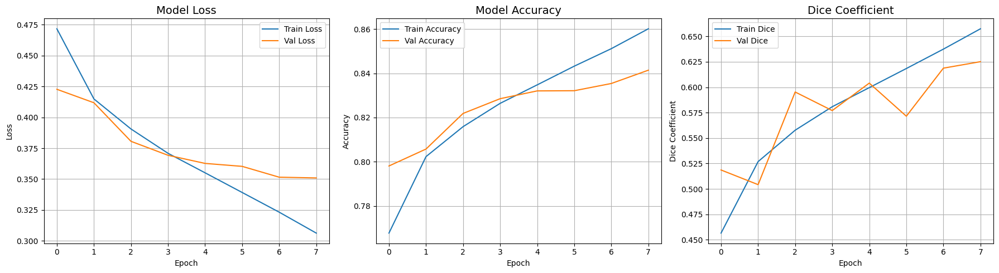


Final Training Accuracy: 0.8602
Final Validation Accuracy: 0.8414
Final Training Dice: 0.6575
Final Validation Dice: 0.6251


In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot loss
axes[0].plot(history.history['loss'], label='Train Loss')
axes[0].plot(history.history['val_loss'], label='Val Loss')
axes[0].set_title('Model Loss', fontsize=14)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True)

# Plot accuracy
axes[1].plot(history.history['accuracy'], label='Train Accuracy')
axes[1].plot(history.history['val_accuracy'], label='Val Accuracy')
axes[1].set_title('Model Accuracy', fontsize=14)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()
axes[1].grid(True)

# Plot dice coefficient
axes[2].plot(history.history['dice_coefficient'], label='Train Dice')
axes[2].plot(history.history['val_dice_coefficient'], label='Val Dice')
axes[2].set_title('Dice Coefficient', fontsize=14)
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Dice Coefficient')
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.show()

print(f"\nFinal Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Dice: {history.history['dice_coefficient'][-1]:.4f}")
print(f"Final Validation Dice: {history.history['val_dice_coefficient'][-1]:.4f}")

# Cell 8: Function to create colored masks from binary predictions

In [ ]:
def create_colored_mask(binary_mask, original_image):
    """
    Create a colored mask by applying the binary mask to the original image

    Args:
        binary_mask: Binary mask (H, W, 1) with values 0-1
        original_image: Original RGB image (H, W, 3) with values 0-1

    Returns:
        Colored mask (H, W, 3) showing only the masked regions in color
    """
    # Ensure binary mask is 3D
    if len(binary_mask.shape) == 2:
        binary_mask = np.expand_dims(binary_mask, axis=-1)

    # Threshold the mask
    binary_mask = (binary_mask > 0.5).astype(np.float32)

    # Apply mask to original image
    colored_mask = original_image * binary_mask

    return colored_mask

def overlay_mask_on_image(image, mask, alpha=0.5, color=[0, 1, 0]):
    """
    Overlay colored mask on original image

    Args:
        image: Original RGB image (H, W, 3)
        mask: Binary mask (H, W, 1)
        alpha: Transparency factor
        color: Color for mask overlay [R, G, B]

    Returns:
        Image with overlaid mask
    """
    if len(mask.shape) == 3:
        mask = mask[:, :, 0]

    mask = (mask > 0.5).astype(np.float32)
    mask_colored = np.zeros_like(image)

    for i in range(3):
        mask_colored[:, :, i] = mask * color[i]

    overlay = image * (1 - alpha * mask[:, :, np.newaxis]) + mask_colored * alpha
    return np.clip(overlay, 0, 1)

print("Colored mask functions ready!")

Colored mask functions ready!


# Run this before Cell 9

In [ ]:
import gc
gc.collect()
tf.keras.backend.clear_session()

# Cell 9: Generate 20 comparison images (SAFEST - One at a time)

Generating 20 comparison images...
Processing one image at a time for maximum memory safety...

✓ Processed 5/20 images
✓ Processed 10/20 images
✓ Processed 15/20 images
✓ Processed 20/20 images

All images processed! Saving figure...


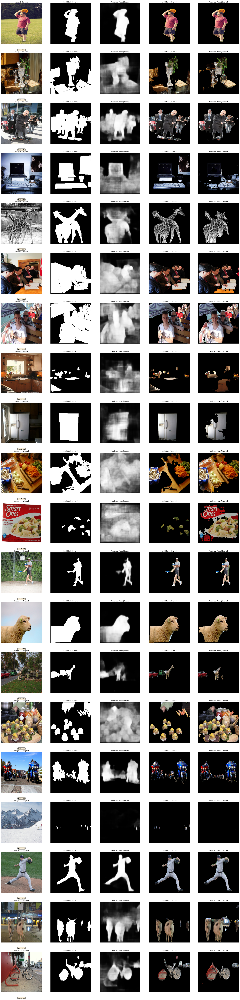


✓ Successfully generated 20 comparison images!
✓ Saved as 'predictions_comparison.png'
✓ Memory safely managed throughout process


In [ ]:
import gc

# Number of images to display
num_display = 20

print(f"Generating {num_display} comparison images...")
print("Processing one image at a time for maximum memory safety...\n")

# Create figure first
fig = plt.figure(figsize=(20, 4 * num_display))

# Process each image individually
for display_idx in range(num_display):
    # Get the batch and index for this image
    batch_num, idx = val_generator.indices[display_idx]

    # Load ONLY this one image using memory mapping
    images = np.load(f'processed_data/images_batch_{batch_num}.npy', mmap_mode='r')
    masks = np.load(f'processed_data/masks_batch_{batch_num}.npy', mmap_mode='r')

    # Copy only the single image we need
    img = np.array([images[idx]], dtype=np.float32)
    mask = np.array([masks[idx]], dtype=np.float32)

    # Delete the memory-mapped arrays immediately
    del images, masks

    # Predict for this single image
    pred = model.predict(img, verbose=0)

    # Calculate row position
    row = display_idx

    # Original image
    ax1 = plt.subplot(num_display, 5, row * 5 + 1)
    ax1.imshow(img[0])
    ax1.set_title(f'Image {display_idx+1}: Original', fontsize=9)
    ax1.axis('off')

    # Ground truth mask (binary)
    ax2 = plt.subplot(num_display, 5, row * 5 + 2)
    ax2.imshow(mask[0, :, :, 0], cmap='gray')
    ax2.set_title('Real Mask (Binary)', fontsize=9)
    ax2.axis('off')

    # Predicted mask (binary)
    ax3 = plt.subplot(num_display, 5, row * 5 + 3)
    ax3.imshow(pred[0, :, :, 0], cmap='gray')
    ax3.set_title('Predicted Mask (Binary)', fontsize=9)
    ax3.axis('off')

    # Ground truth colored mask
    ax4 = plt.subplot(num_display, 5, row * 5 + 4)
    gt_colored = create_colored_mask(mask[0], img[0])
    ax4.imshow(gt_colored)
    ax4.set_title('Real Mask (Colored)', fontsize=9)
    ax4.axis('off')

    # Predicted colored mask
    ax5 = plt.subplot(num_display, 5, row * 5 + 5)
    pred_colored = create_colored_mask(pred[0], img[0])
    ax5.imshow(pred_colored)
    ax5.set_title('Predicted Mask (Colored)', fontsize=9)
    ax5.axis('off')

    # Calculate and display IoU
    gt_binary = (mask[0, :, :, 0] > 0.5).astype(float)
    pred_binary = (pred[0, :, :, 0] > 0.5).astype(float)
    intersection = np.sum(gt_binary * pred_binary)
    union = np.sum((gt_binary + pred_binary) > 0)
    iou = intersection / (union + 1e-7)

    ax1.text(0.5, -0.15, f'IoU: {iou:.3f}',
             transform=ax1.transAxes,
             fontsize=8,
             ha='center',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    # Aggressively delete everything after each image
    del img, mask, pred, gt_colored, pred_colored
    del gt_binary, pred_binary

    # Force garbage collection every 5 images
    if (display_idx + 1) % 5 == 0:
        gc.collect()
        print(f"✓ Processed {display_idx + 1}/{num_display} images")

# Final cleanup before saving
gc.collect()

print("\nAll images processed! Saving figure...")
plt.tight_layout()
plt.savefig('predictions_comparison.png', dpi=100, bbox_inches='tight')
plt.show()

# Final memory cleanup
plt.close(fig)
gc.collect()

print("\n" + "="*60)
print("✓ Successfully generated 20 comparison images!")
print("✓ Saved as 'predictions_comparison.png'")
print("✓ Memory safely managed throughout process")
print("="*60)

# Cell 10: Alternative visualization with overlays - 20 images (SAFEST)

Generating 20 overlay comparison images...
Processing one image at a time for maximum memory safety...

✓ Processed 5/20 images
✓ Processed 10/20 images
✓ Processed 15/20 images
✓ Processed 20/20 images

All overlay images processed! Saving figure...


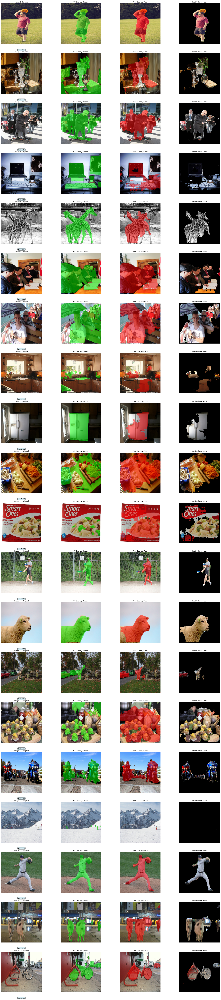


✓ Successfully generated 20 overlay comparison images!
✓ Saved as 'predictions_overlay.png'
✓ Memory safely managed throughout process


In [ ]:
import gc

num_display = 20

print(f"Generating {num_display} overlay comparison images...")
print("Processing one image at a time for maximum memory safety...\n")

# Create figure
fig = plt.figure(figsize=(20, 4 * num_display))

# Process each image individually
for display_idx in range(num_display):
    # Get the batch and index for this image
    batch_num, idx = val_generator.indices[display_idx]

    # Load ONLY this one image
    images = np.load(f'processed_data/images_batch_{batch_num}.npy', mmap_mode='r')
    masks = np.load(f'processed_data/masks_batch_{batch_num}.npy', mmap_mode='r')

    img = np.array([images[idx]], dtype=np.float32)
    mask = np.array([masks[idx]], dtype=np.float32)

    del images, masks

    # Predict for this single image
    pred = model.predict(img, verbose=0)

    row = display_idx

    # Original image
    ax1 = plt.subplot(num_display, 4, row * 4 + 1)
    ax1.imshow(img[0])
    ax1.set_title(f'Image {display_idx+1}: Original', fontsize=9)
    ax1.axis('off')

    # Original with ground truth overlay (green)
    ax2 = plt.subplot(num_display, 4, row * 4 + 2)
    gt_overlay = overlay_mask_on_image(
        img[0],
        mask[0],
        alpha=0.5,
        color=[0, 1, 0]
    )
    ax2.imshow(gt_overlay)
    ax2.set_title('GT Overlay (Green)', fontsize=9)
    ax2.axis('off')

    # Original with prediction overlay (red)
    ax3 = plt.subplot(num_display, 4, row * 4 + 3)
    pred_overlay = overlay_mask_on_image(
        img[0],
        pred[0],
        alpha=0.5,
        color=[1, 0, 0]
    )
    ax3.imshow(pred_overlay)
    ax3.set_title('Pred Overlay (Red)', fontsize=9)
    ax3.axis('off')

    # Colored predicted mask
    ax4 = plt.subplot(num_display, 4, row * 4 + 4)
    pred_colored = create_colored_mask(pred[0], img[0])
    ax4.imshow(pred_colored)
    ax4.set_title('Pred Colored Mask', fontsize=9)
    ax4.axis('off')

    # Calculate IoU
    gt_binary = (mask[0, :, :, 0] > 0.5).astype(float)
    pred_binary = (pred[0, :, :, 0] > 0.5).astype(float)
    intersection = np.sum(gt_binary * pred_binary)
    union = np.sum((gt_binary + pred_binary) > 0)
    iou = intersection / (union + 1e-7)

    # Add IoU to first subplot
    ax1.text(0.5, -0.15, f'IoU: {iou:.3f}',
             transform=ax1.transAxes,
             fontsize=8,
             ha='center',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

    # Delete everything
    del img, mask, pred, gt_overlay, pred_overlay, pred_colored
    del gt_binary, pred_binary

    # Garbage collection every 5 images
    if (display_idx + 1) % 5 == 0:
        gc.collect()
        print(f"✓ Processed {display_idx + 1}/{num_display} images")

# Final cleanup
gc.collect()

print("\nAll overlay images processed! Saving figure...")
plt.tight_layout()
plt.savefig('predictions_overlay.png', dpi=100, bbox_inches='tight')
plt.show()

# Final memory cleanup
plt.close(fig)
gc.collect()

print("\n" + "="*60)
print("✓ Successfully generated 20 overlay comparison images!")
print("✓ Saved as 'predictions_overlay.png'")
print("✓ Memory safely managed throughout process")
print("="*60)